In [54]:
#import packages
using Pkg, DifferentialEquations, PenaltyFunctions, Optim, StatsBase, Plots, CSV, DataFrames, DiffEqParamEstim;

In [2]:
#Exponential growth problem 
function singleExpGrowth(du,u,p,t)
    du[1] = p[1].*u[1]
end

singleExpGrowth (generic function with 1 method)

In [3]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_exp(params, data)
    prob = ODEProblem(singleExpGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum((data .- model_data).^2)
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss/n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_exp (generic function with 1 method)

In [190]:
model_data

12-element Vector{Float64}:
 12000.0
 12764.224909208475
 13577.119739814929
 14441.785646430679
 15361.515813481628
 16339.817145122486
 17380.42561954744
 18487.30719867727
 19664.68022181146
 20917.030844119567
 22249.13920486069
 23666.086887077443

In [124]:
size(data,2)

3

In [453]:
#import data
t1="/blue/ferrallm/adelpinoherrera/Pt-res-OvCa/UFHCC2024/tyk-nu-12x3.csv"
t=CSV.read(t1,DataFrame)
data=Matrix(t)

12×3 Matrix{Float64}:
  12000.0         12000.0         12000.0
  15270.1         18574.4         13167.3
   6508.56         6308.3         11515.2
  12065.9          9362.32        11815.5
  16321.5         31040.8         22329.4
      1.10545e5       1.02084e5   94774.7
      2.07072e5       2.62746e5       2.86427e5
      4.26411e5  487141.0             5.18532e5
      3.2673e5        3.55267e5       4.7152e5
 446087.0        389112.0             3.94769e5
      2.86928e5       2.11378e5       3.29233e5
      2.28451e5       2.72709e5  289531.0

In [454]:
#separate by data points
timepts= [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0];
repli1=data[:,1];
repli2=data[:,2];
repli3=data[:,3];

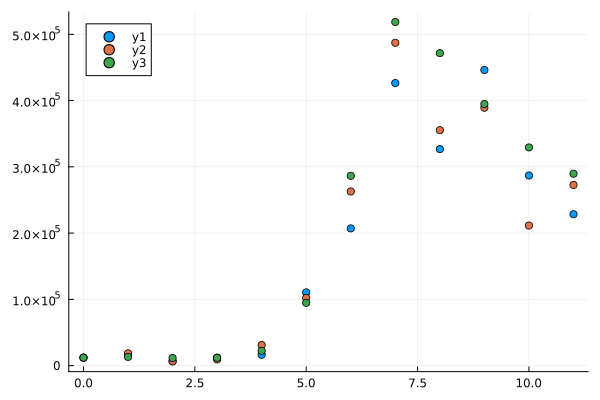

In [455]:
#plot data
scatter(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

In [246]:
#define the initial guess
initial_guess=[0.05]

1-element Vector{Float64}:
 0.05

In [247]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


 * Status: success

 * Candidate solution
    Final objective value:     9.640198e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.09e-09 ≰ 0.0e+00
    |x - x'|/|x'|          = 3.32e-09 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.32e-11 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.37e-14 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    4
    f(x) calls:    17
    ∇f(x) calls:   17


In [248]:
paramFIT = result.minimizer

1-element Vector{Float64}:
 0.32898232948307315

In [230]:
optimized_aic_exp=calculate_aic_exp(paramFIT,data)

964.0197545152633

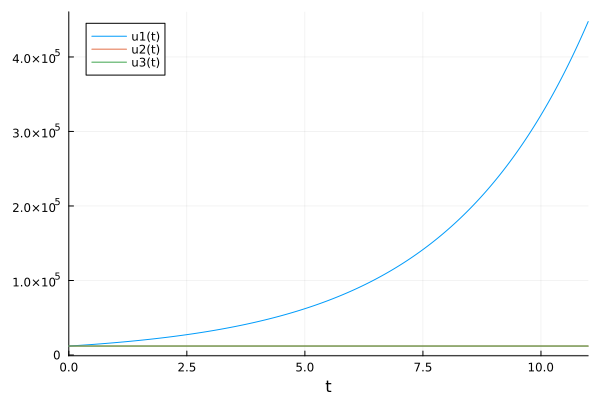

In [231]:
problem = ODEProblem(singleExpGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

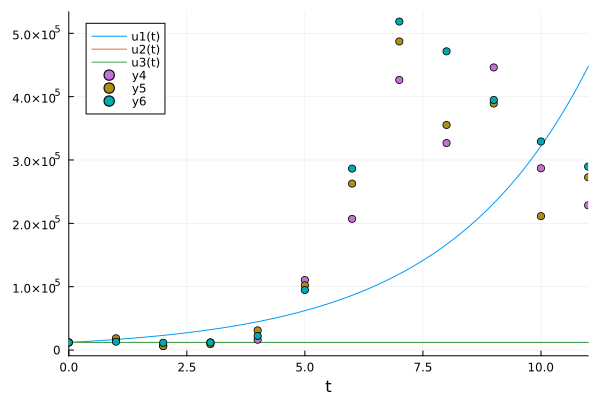

In [232]:
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

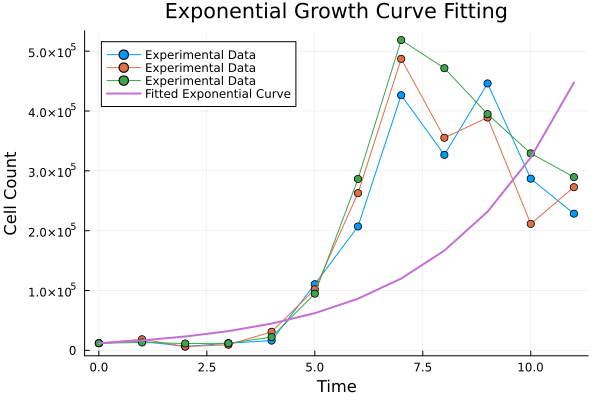

In [249]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleExpGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Exponential Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Exponential Growth Curve Fitting")


In [250]:
model_data

12-element Vector{Float64}:
  12000.0
  16674.643860109085
  23170.309359877905
  32196.360729090753
  44738.37616942418
  62166.69363418779
  86383.10486262159
 120034.51380713256
 166791.79140010543
 231769.03520213914
 322042.60357981565
 447508.1436986767

In [4]:
#logistic growth problem 
function singleLogGrowth(du,u,p,t)
    du[1] = p[1].*u[1].*(1-(u[1]./p[2]))
end

singleLogGrowth (generic function with 1 method)

In [5]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_log(params, data)
    prob = ODEProblem(singleLogGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum(((data .- model_data).^2))
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss / n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_log (generic function with 1 method)

In [236]:
initial_guess=[0.05,600000]

2-element Vector{Float64}:
      0.05
 600000.0

In [237]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_log(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=2.4194389159848497, and step error estimate = 59.966169051495626. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:599
┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=2.4194682175342686, and step error estimate = 59.966188850504516. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:599
┌ Warning: dt(1.7763568394002505e-15) <= dtmin(1.7763568394002505e-15) at t=2.419449647790047, and step error estimate = 59.966109426858026. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:599
┌ Warning: dt(1.7763568394002505e-15) <= dtm

 * Status: failure (objective increased between iterations) (line search failed)

 * Candidate solution
    Final objective value:     9.248321e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 2.84e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 7.63e-16 ≰ 0.0e+00
    |f(x) - f(x')|         = 3.77e-08 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 4.08e-11 ≰ 0.0e+00
    |g(x)|                 = 2.61e-05 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    212
    f(x) calls:    1289
    ∇f(x) calls:   1289


In [238]:
paramFIT = result.minimizer

2-element Vector{Float64}:
      0.6828756149881707
 372148.866201276

In [239]:
optimized_aic_log=calculate_aic_log(paramFIT,data)

924.8320562240232

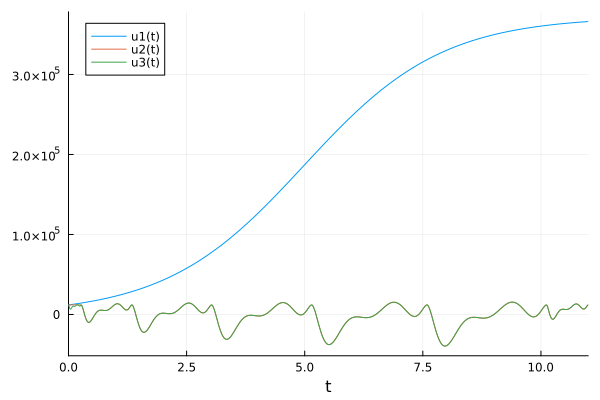

In [242]:
problem = ODEProblem(singleLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

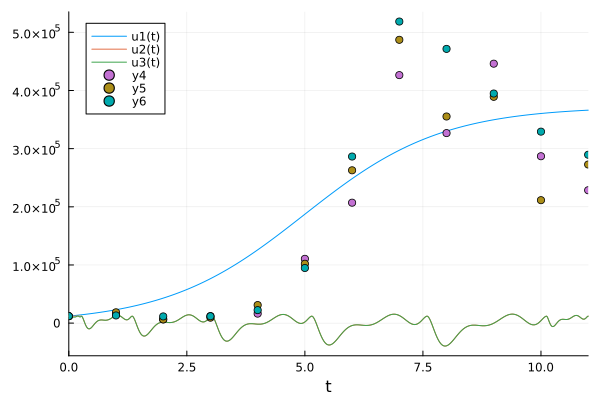

In [243]:
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

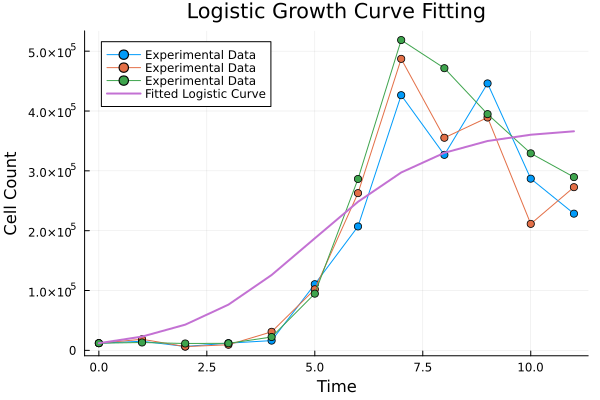

In [244]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Logistic Growth Curve Fitting")

In [245]:
model_data

12-element Vector{Float64}:
  12000.0
  23027.398345461952
  42978.9055060975
  76432.96984263028
 125964.2182394118
 187267.379012933
 248300.4804437105
 297259.15137789806
 330146.812724274
 349880.06613128167
 360349.4525845548
 366092.621071714

In [6]:
# gompertz growth of a single population with carrying capacity
function singleGompGrowth(du,u,p,t)
    du[1] = p[1].*log(p[2]./u[1]).*u[1] #Maxi
end

singleGompGrowth (generic function with 1 method)

In [7]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_gomp(params, data)
    prob = ODEProblem(singleGompGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum(((data .- model_data).^2))
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss / n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_gomp (generic function with 1 method)

In [253]:
initial_guess=[0.05,600000]

2-element Vector{Float64}:
      0.05
 600000.0

In [254]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_gomp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.333961e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 6.39e+03 ≰ 1.0e-16

 * Work counters
    Seconds run:   1  (vs limit Inf)
    Iterations:    33
    f(x) calls:    1050
    ∇f(x) calls:   1050


In [255]:
paramFIT = result.minimizer

2-element Vector{Float64}:
      0.2980800657808599
 426640.8099895525

In [256]:
optimized_aic_gomp=calculate_aic_gomp(paramFIT,data)

933.3960957545487

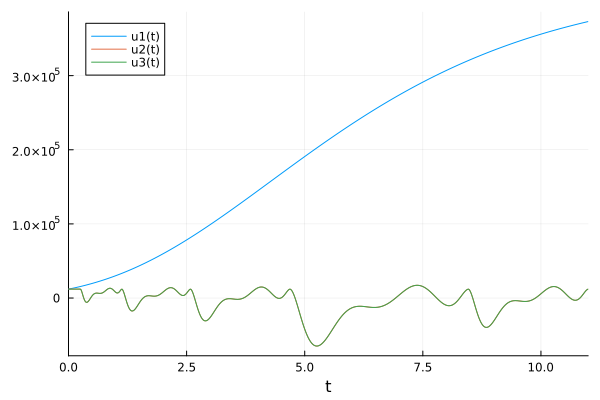

In [257]:
problem = ODEProblem(singleGompGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

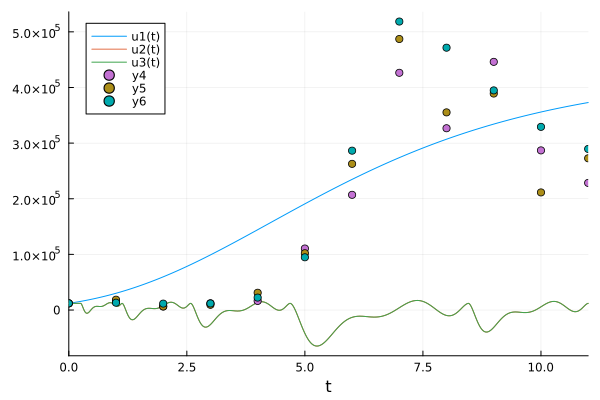

In [258]:
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

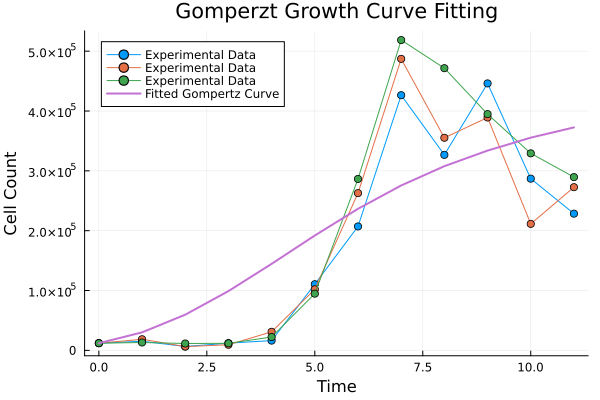

In [259]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGompGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Gompertz Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Gomperzt Growth Curve Fitting")

In [260]:
model_data

12-element Vector{Float64}:
  12000.0
  30125.438786524515
  59654.8838925126
  99055.44570274853
 144595.25298128522
 191947.26370702454
 236576.92514529772
 275591.15258341393
 307827.1741924975
 333852.53102749353
 355459.4475553196
 372583.0202803335

In [8]:
# von bertalanffy growth of a single population assuming sphere
function singleBertGrowth(du,u,p,t)
    du[1] = p[1].*(u[1].^(2/3)) #maxi
    #du[1] = p[1].*(u[1].^(2/3)) - p[2].*u[1]
end

singleBertGrowth (generic function with 1 method)

In [9]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_bert(params, data)
    prob = ODEProblem(singleBertGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum(((data .- model_data).^2))
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss / n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_bert (generic function with 1 method)

In [272]:
initial_guess=[10.0]

1-element Vector{Float64}:
 10.0

In [274]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_bert(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.496014e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 8.81e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 6.01e-11 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    6
    f(x) calls:    15
    ∇f(x) calls:   15


In [276]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 14.645680560510478

In [277]:
optimized_aic_gomp=calculate_aic_bert(paramFIT,data)

949.601356505207

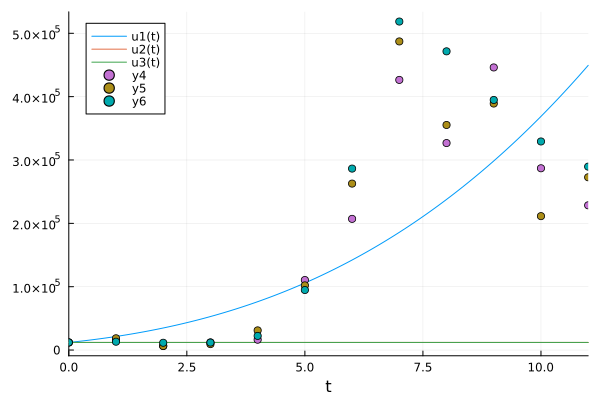

In [279]:
problem = ODEProblem(singleBertGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

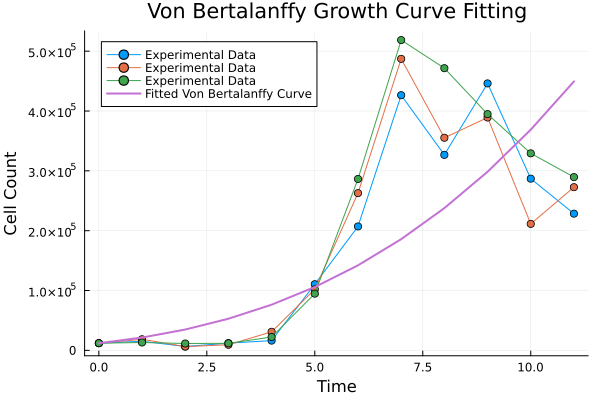

In [280]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleBertGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Von Bertalanffy Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Von Bertalanffy Growth Curve Fitting")

In [281]:
model_data

12-element Vector{Float64}:
  12000.0
  21429.762918747325
  34831.444155315854
  52903.097731810696
  76342.86390027837
 105848.97176891944
 142118.93089081315
 185851.9729067581
 237744.63038857532
 298496.3136447864
 368805.6047398945
 449368.9343749986

In [10]:
# generalized logistic growth of a single population with carrying capacity
function singleGenLogGrowth(du,u,p,t)
    du[1] = p[1].*u[1].*(1-(abs(u[1]./p[2]).^abs(p[3])))
end

singleGenLogGrowth (generic function with 1 method)

In [11]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_genlog(params, data)
    prob = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum(((data .- model_data).^2))
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss / n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_genlog (generic function with 1 method)

In [489]:
initial_guess=[0.3,400000, 1.0]

3-element Vector{Float64}:
      0.3
 400000.0
      1.0

In [490]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_genlog(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.071753e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 2.81e-02 ≰ 1.0e-16

 * Work counters
    Seconds run:   2  (vs limit Inf)
    Iterations:    915
    f(x) calls:    3447
    ∇f(x) calls:   3447


In [491]:
paramFIT=result.minimizer

3-element Vector{Float64}:
      0.49521364187784206
 357811.04754339164
     26.83622389756728

In [492]:
optimized_aic_genlog=calculate_aic_genlog(paramFIT,data)

907.1753473206012

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


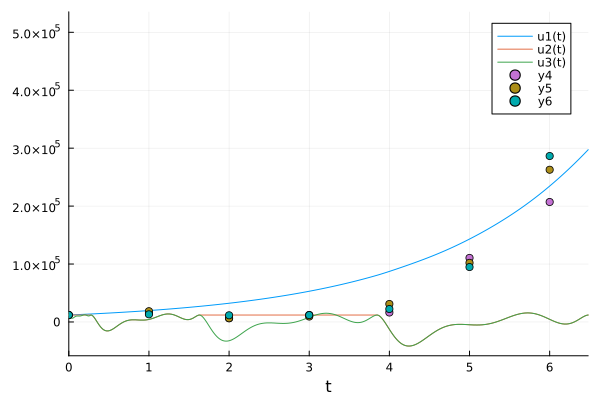

In [493]:
problem = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

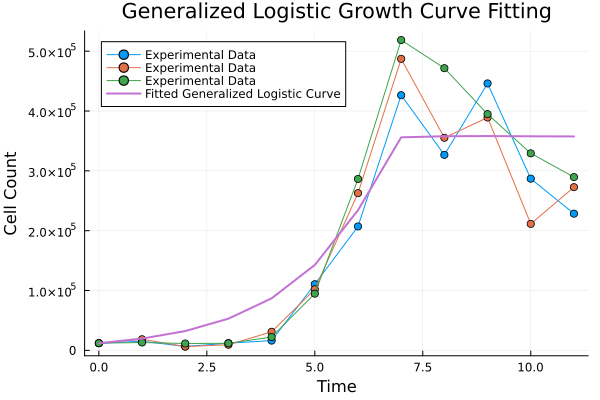

In [494]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGenLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Generalized Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Generalized Logistic Growth Curve Fitting")

In [495]:
model_data

12-element Vector{Float64}:
  12000.0
  19690.17714804749
  32308.5816295941
  53013.35218889676
  86986.1702754472
 142730.8313338579
 234200.91440456978
 356007.709024072
 357799.3609950124
 358109.92518215225
 357735.02543721447
 357476.77836952714

In [372]:
#new data
#import data
t1="/blue/ferrallm/adelpinoherrera/Pt-res-OvCa/UFHCC2024/tyk-nucp.r-12x3.csv"
t=CSV.read(t1,DataFrame)
data=Matrix(t)

12×3 Matrix{Float64}:
  12000.0        12000.0         12000.0
  12666.7        12115.9         13617.9
  11214.8        11064.6         13818.2
  20877.5        22179.2         19125.2
  53220.0        60479.6         48964.4
      2.12329e5      2.39665e5  146693.0
 268253.0            2.94638e5       2.66901e5
      2.82672e5      3.17368e5       3.34991e5
      3.09808e5      3.23876e5       2.78516e5
      3.15515e5      3.14814e5       3.44804e5
      2.55436e5      2.45323e5       2.34008e5
      3.19871e5      3.1907e5        3.29433e5

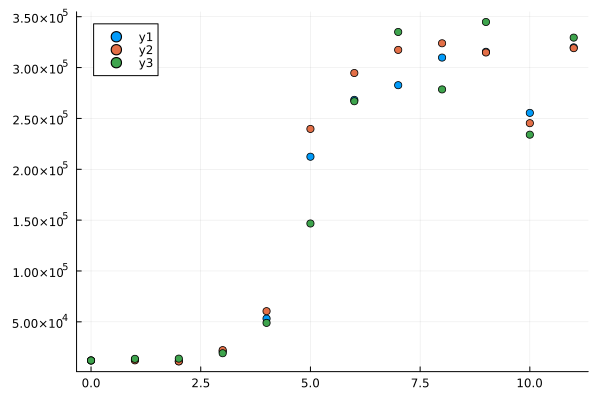

In [373]:
repli1=data[:,1];
repli2=data[:,2];
repli3=data[:,3];

scatter(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

In [343]:
initial_guess=[0.1]

1-element Vector{Float64}:
 0.1

In [344]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


 * Status: success (objective increased between iterations)

 * Candidate solution
    Final objective value:     9.394766e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 7.59e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 2.34e-09 ≰ 0.0e+00
    |f(x) - f(x')|         = 7.28e-12 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 7.74e-15 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    7
    f(x) calls:    28
    ∇f(x) calls:   28


In [345]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 0.32476163991699786

In [346]:
optimized_aic_exp=calculate_aic_exp(paramFIT,data)

939.4765765949337

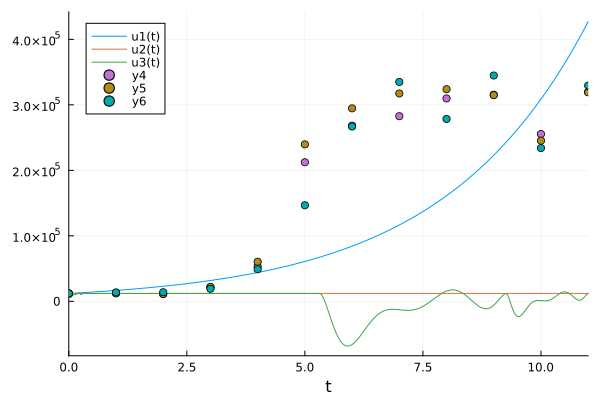

In [347]:
problem = ODEProblem(singleExpGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

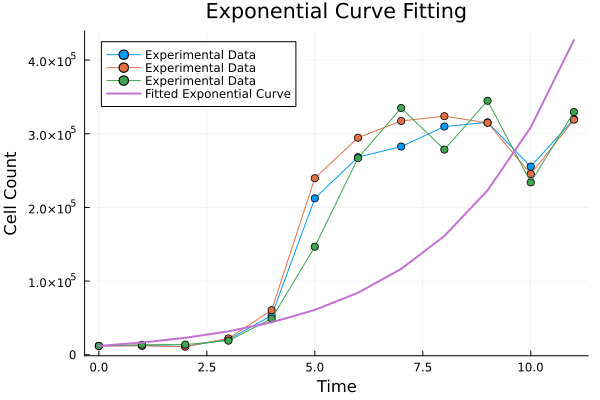

In [348]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleExpGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Exponential Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Exponential Curve Fitting")

In [349]:
model_data

12-element Vector{Float64}:
  12000.0
  16604.413583493057
  22975.54204751345
  31791.255286507723
  43989.42017977158
  60868.52181652798
  84222.90288667343
 116540.25449772949
 161253.561238807
 223130.7837238527
 308732.7170307202
 427206.36526686203

In [374]:
initial_guess=[0.3,400000.0]

2-element Vector{Float64}:
      0.3
 400000.0

In [375]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_log(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     8.732465e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.01e-06 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    98
    f(x) calls:    522
    ∇f(x) calls:   522


In [376]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      0.7019949959965264
 323132.5718355719

In [377]:
optimized_aic_log=calculate_aic_log(paramFIT,data)

873.2464741987536

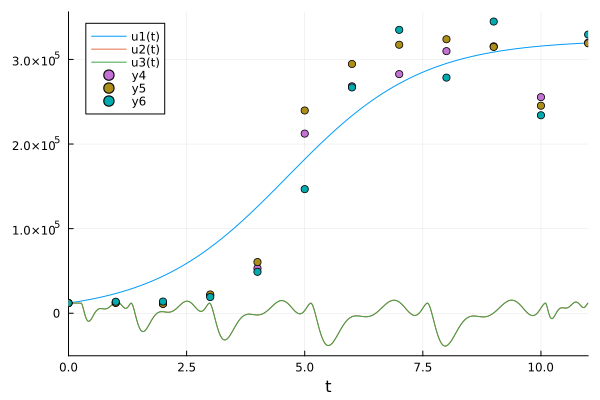

In [379]:
problem = ODEProblem(singleLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

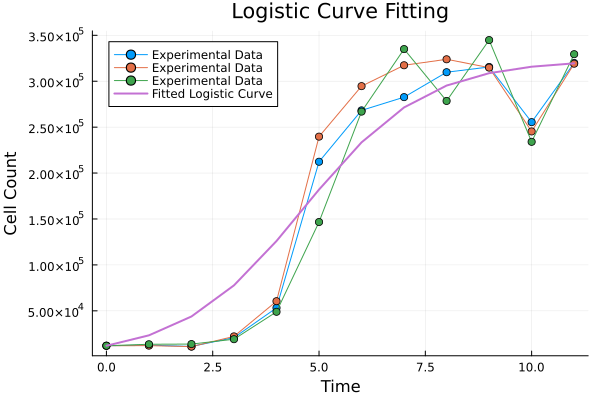

In [380]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Logistic Curve Fitting")

In [381]:
model_data

12-element Vector{Float64}:
  12000.0
  23331.443383481866
  43854.632800840445
  77749.75165463737
 126022.4152614136
 182029.3396957218
 233437.40834239763
 271466.34528524324
 295280.4086099469
 308762.8151000818
 315795.0122576046
 319453.82129253104

In [390]:
initial_guess=[0.8,100000.0]

2-element Vector{Float64}:
      0.8
 100000.0

In [391]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_gomp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     8.876519e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.09e-06 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    38
    f(x) calls:    141
    ∇f(x) calls:   141


In [392]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      0.3062157342653982
 375970.63070419454

In [393]:
optimized_aic_gomp=calculate_aic_gomp(paramFIT,data)

887.6519310177331

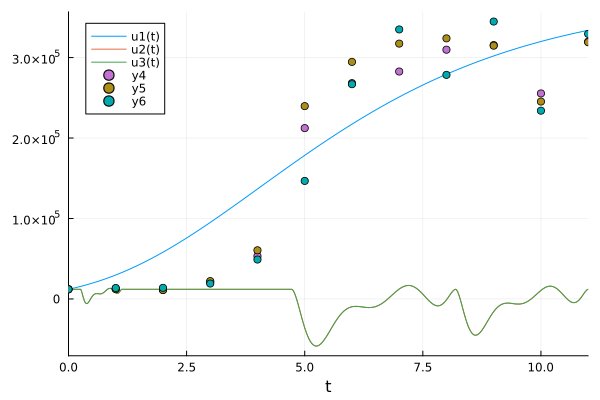

In [394]:
problem = ODEProblem(singleGompGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

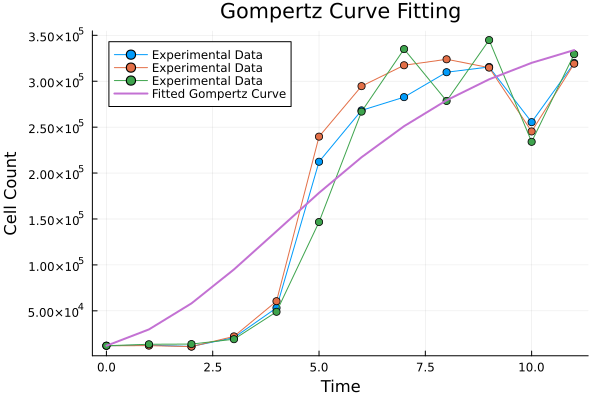

In [395]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGompGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Gompertz Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Gompertz Curve Fitting")

In [396]:
model_data

12-element Vector{Float64}:
  12000.0
  29769.896189442847
  58115.187782362824
  95098.35390775796
 136660.35286835572
 178472.90190532123
 217231.90329008136
 251051.3579658644
 279271.4514621075
 302057.8467988332
 320009.22325411136
 333905.9761177642

In [397]:
initial_guess=[10.0]

1-element Vector{Float64}:
 10.0

In [398]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_bert(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success (objective increased between iterations)

 * Candidate solution
    Final objective value:     9.189706e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 8.31e-09 ≰ 0.0e+00
    |x - x'|/|x'|          = 5.90e-10 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.14e-13 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.24e-16 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    5
    f(x) calls:    12
    ∇f(x) calls:   12


In [399]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 14.09088183230595

In [400]:
optimized_aic_bert=calculate_aic_bert(paramFIT,data)

918.9705906871583

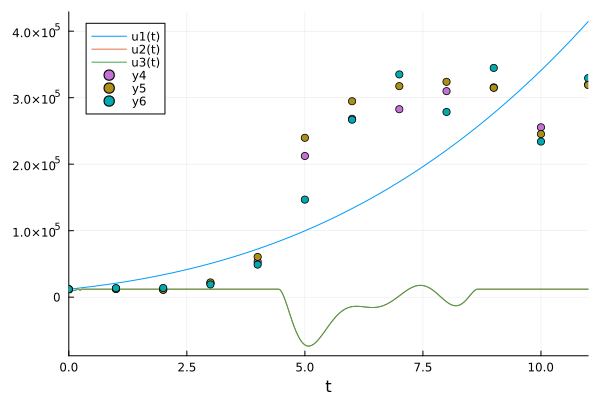

In [401]:
problem = ODEProblem(singleBertGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

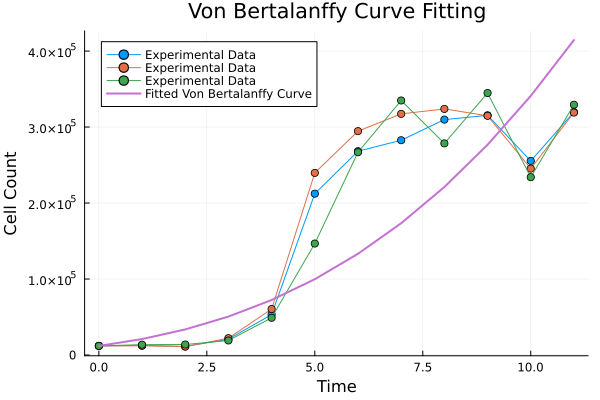

In [402]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleBertGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Von Bertalanffy Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Von Bertalanffy Curve Fitting")

In [403]:
model_data

12-element Vector{Float64}:
  12000.0
  21004.57028471566
  33661.35319169865
  50592.04126897159
  72418.44606942247
  99762.25748648478
 133244.9736865284
 173488.8644153792
 221115.14148122477
 276745.2484333896
 341002.8612636661
 414507.5329918952

In [442]:
# generalized logistic growth of a single population with carrying capacity
function singleGenLogGrowth(du,u,p,t)
    du[1] = p[1].*u[1].*(1-(abs(u[1]./p[2]).^abs(p[3])))
end

singleGenLogGrowth (generic function with 1 method)

In [443]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_genlog(params, data)
    prob = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum(((data .- model_data).^2))
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss / n) + n * (1 + log(2 * π))
    return aic
end

calculate_aic_genlog (generic function with 1 method)

In [445]:
initial_guess=[0.3,400000.0,1.0]

3-element Vector{Float64}:
      0.3
 400000.0
      1.0

In [446]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_genlog(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability d

 * Status: success

 * Candidate solution
    Final objective value:     8.545586e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.66e+04 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    143
    f(x) calls:    599
    ∇f(x) calls:   599


In [447]:
paramFIT=result.minimizer

3-element Vector{Float64}:
      0.530329060533386
 299795.7115617035
     11.252323382893252

In [449]:
optimized_aic_genlog=calculate_aic_genlog(paramFIT,data)

854.5585706726208

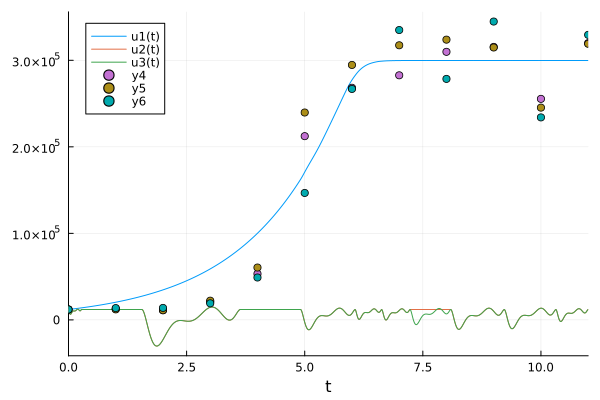

In [450]:
problem = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)

scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

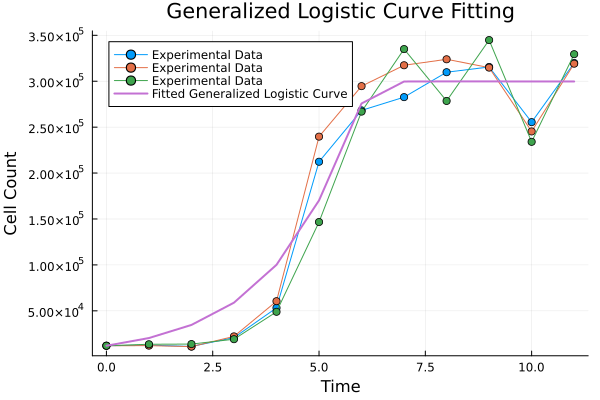

In [451]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGenLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Generalized Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Generalized Logistic Curve Fitting")

In [452]:
model_data

12-element Vector{Float64}:
  12000.0
  20393.88625056697
  34659.24388664945
  58903.04475197081
 100104.5955531624
 170231.89513971435
 275778.61947811046
 299680.25932229304
 299791.1959568465
 299809.2541830093
 299700.47667964187
 299710.3583432226

In [12]:
#new dataset
t1="/blue/ferrallm/adelpinoherrera/Pt-res-OvCa/UFHCC2024/a2780-12x3.csv"
t=CSV.read(t1,DataFrame)
data=Matrix(t)

12×3 Matrix{Float64}:
  15000.0         15000.0         15000.0
  12516.5         15320.2         17272.7
      1.48696e5       1.31173e5       1.41236e5
      4.3297e5        3.69186e5       4.13794e5
 377697.0        322975.0             2.99744e5
      5.97987e5       5.1673e5        4.74725e5
      5.95484e5       5.57584e5       5.4732e5
 650556.0             6.82348e5       6.75939e5
      5.0937e5   524390.0             5.08619e5
      7.1414e5        7.02574e5       6.97568e5
      6.81146e5       7.3747e5   709083.0
      8.92174e5       8.52672e5       8.30142e5

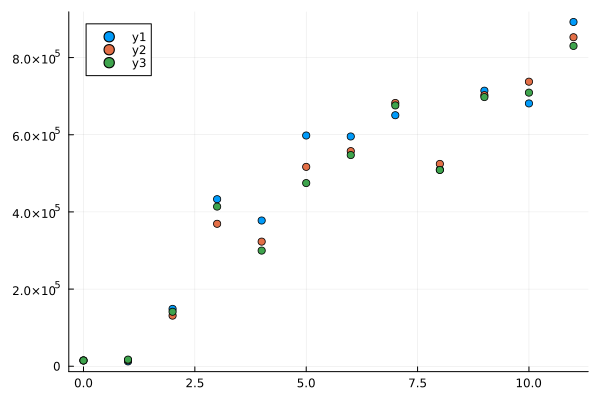

In [13]:
timepts= [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0];
repli1=data[:,1];
repli2=data[:,2];
repli3=data[:,3];

scatter(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

In [20]:
initial_guess=[0.05]

1-element Vector{Float64}:
 0.05

In [21]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


 * Status: success

 * Candidate solution
    Final objective value:     1.005012e+03

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.48e-12 ≰ 0.0e+00
    |x - x'|/|x'|          = 3.81e-12 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.43e-05 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    15
    f(x) calls:    81
    ∇f(x) calls:   81


In [22]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 0.3890085579180817

In [23]:
optimized_aic_exp=calculate_aic_exp(paramFIT,data)

1005.0120696341102

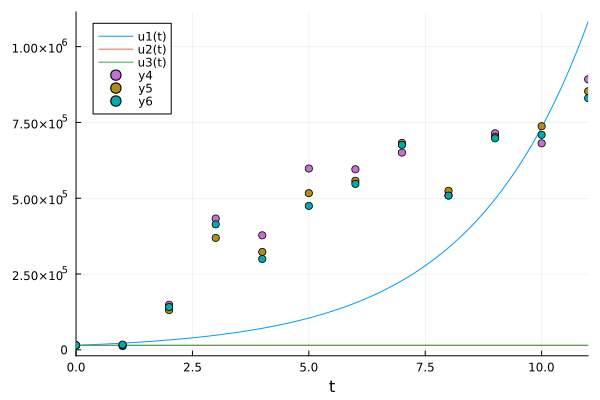

In [24]:
problem = ODEProblem(singleExpGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

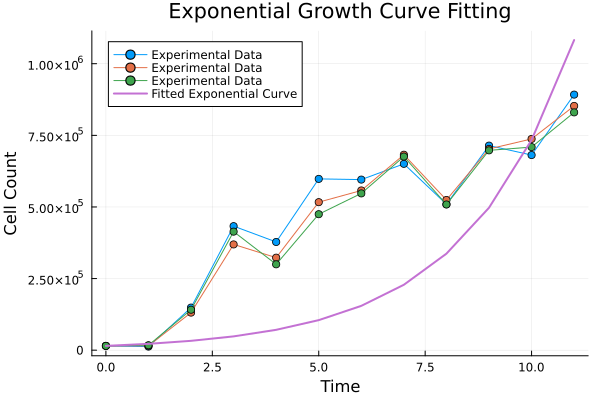

In [25]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleExpGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Exponential Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Exponential Growth Curve Fitting")

In [26]:
model_data

12-element Vector{Float64}:
  15000.0
  22132.76176317475
  32657.262924692972
  48186.39041216542
  71099.75246129282
 104907.82318906444
 154794.36870760837
 228399.71458833743
 337003.0163284633
 497256.3505591709
 733696.9679191959
      1.0825968999291735e6

In [46]:
#logistic growth
initial_guess=[0.9,400000]

2-element Vector{Float64}:
      0.9
 400000.0

In [47]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_log(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.307243e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 3.01e-13 ≰ 0.0e+00
    |x - x'|/|x'|          = 4.40e-19 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 3.63e-04 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    153
    f(x) calls:    632
    ∇f(x) calls:   632


In [48]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      1.0450308890877948
 683188.6706433479

In [50]:
optimized_aic_log=calculate_aic_log(paramFIT,data)

930.7242828632635

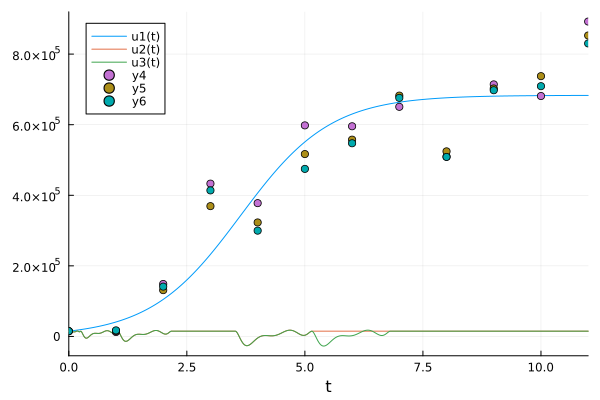

In [51]:
problem = ODEProblem(singleLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

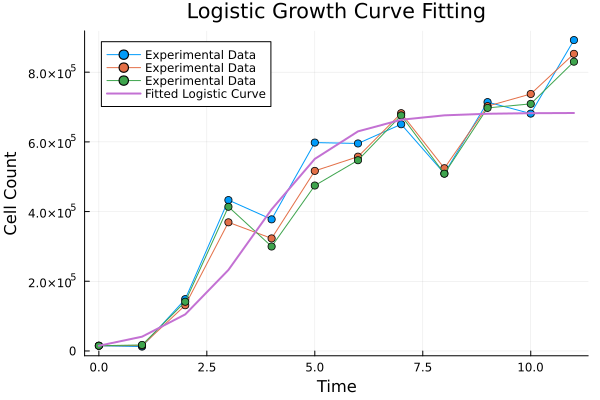

In [52]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Logistic Growth Curve Fitting")

In [53]:
model_data

12-element Vector{Float64}:
  15000.0
  40993.044850298626
 104953.04258233221
 232571.89304085769
 406318.64485763176
 551126.5864659394
 630149.3275322226
 663549.9852972792
 676170.3736941902
 680684.8435406818
 682294.8513217138
 682872.032891731

In [65]:
#gompertz growth
initial_guess=[0.9,400000]

2-element Vector{Float64}:
      0.9
 400000.0

In [66]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_gomp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.179500e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 8.21e-13 ≰ 0.0e+00
    |x - x'|/|x'|          = 1.09e-18 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 5.28e-05 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    144
    f(x) calls:    742
    ∇f(x) calls:   742


In [67]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      0.45110936648556843
 754531.1365472538

In [68]:
optimized_aic_gomp=calculate_aic_gomp(paramFIT,data)

917.9499966533457

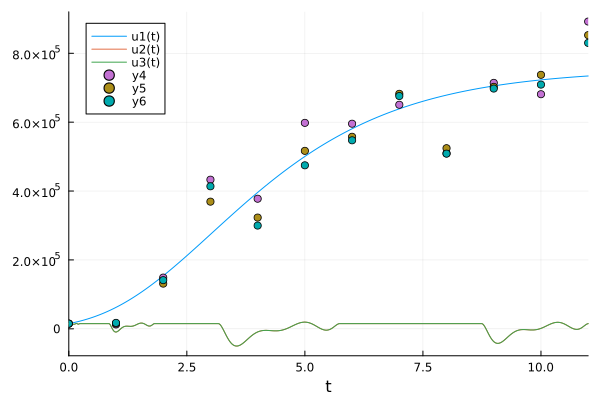

In [69]:
problem = ODEProblem(singleGompGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

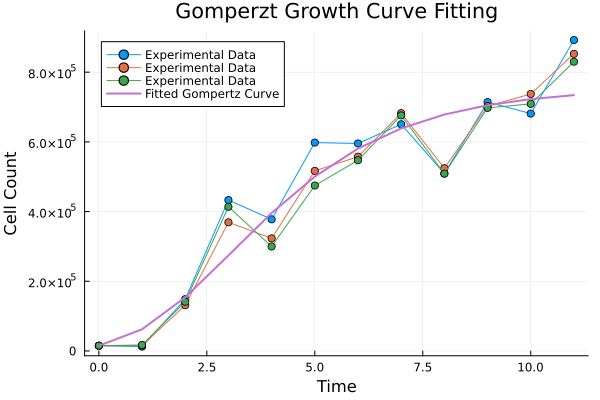

In [70]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGompGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Gompertz Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Gomperzt Growth Curve Fitting")

In [71]:
model_data

12-element Vector{Float64}:
  15000.0
  62215.86962527531
 153956.18971847286
 274172.36371379695
 395961.4245521697
 500407.971119663
 580875.8828353179
 638770.7882338989
 678568.5988732585
 705225.5098243839
 722740.0490822525
 734123.4733181901

In [72]:
initial_guess=[10.0]

1-element Vector{Float64}:
 10.0

In [73]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_bert(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success (objective increased between iterations)

 * Candidate solution
    Final objective value:     9.805236e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 9.05e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 4.34e-11 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.14e-13 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.16e-16 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    5
    f(x) calls:    17
    ∇f(x) calls:   17


In [74]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 20.82841181335058

In [75]:
optimized_aic_bert=calculate_aic_bert(paramFIT,data)

980.5236247714425

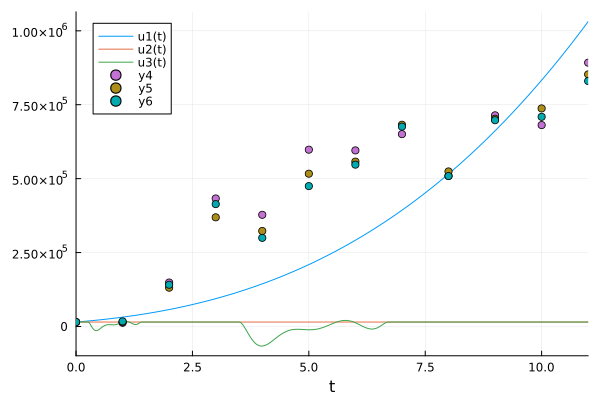

In [76]:
problem = ODEProblem(singleBertGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)


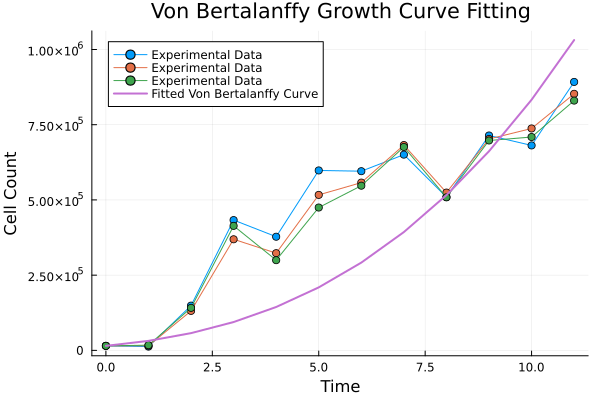

In [77]:
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleBertGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Von Bertalanffy Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Von Bertalanffy Growth Curve Fitting")

In [78]:
model_data

12-element Vector{Float64}:
  15000.0
  31569.24944041404
  57279.09037104158
  94137.51491867188
 144152.5767332631
 209331.54500207448
 291683.6867870022
 393215.3577993769
 515936.8244479777
 661851.456092928
 832975.2762167823
      1.0313095863028099e6

In [156]:
initial_guess=[0.9,400000.0,1.0]

3-element Vector{Float64}:
      0.9
 400000.0
      1.0

In [157]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_genlog(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: failure (line search failed)

 * Candidate solution
    Final objective value:     9.526924e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 4.06e-08 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 4.26e-11 ≰ 0.0e+00
    |g(x)|                 = 6.37e-04 ≰ 1.0e-16

 * Work counters
    Seconds run:   1  (vs limit Inf)
    Iterations:    442
    f(x) calls:    1656
    ∇f(x) calls:   1656


In [158]:
paramFIT=result.minimizer

3-element Vector{Float64}:
      1.0983016911848826
 610782.0546849006
     13.11898986760251

In [160]:
optimized_aic_genlog=calculate_aic_genlog(paramFIT,data)

952.6923846659093

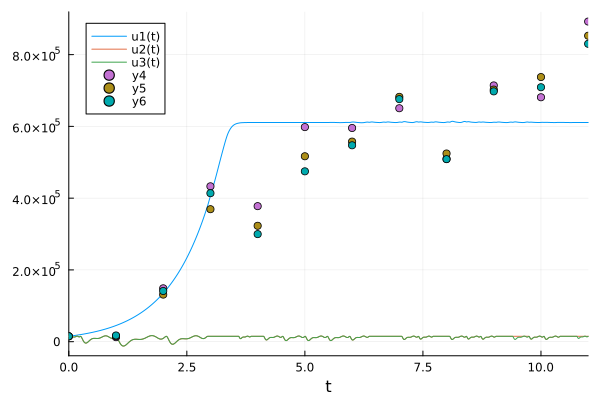

In [159]:
problem = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

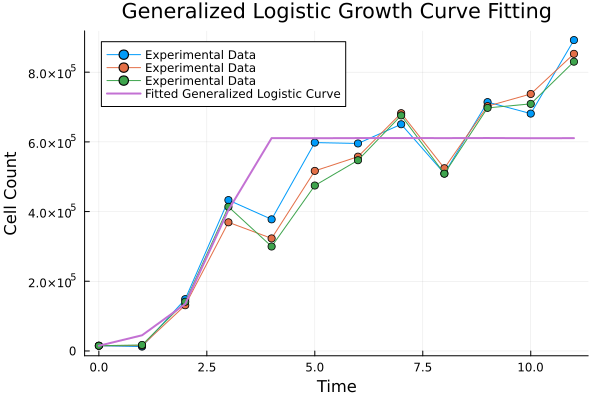

In [161]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGenLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Generalized Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Generalized Logistic Growth Curve Fitting")

In [162]:
model_data

12-element Vector{Float64}:
  15000.0
  44985.90971262873
 134913.85398359798
 404467.0618257205
 610773.0350646332
 610491.8498300273
 610868.5841905975
 610989.4050737816
 610788.5655117776
 611065.0976066056
 610512.7280496035
 610706.8923667808

In [167]:
#last data set
#new dataset
t1="/blue/ferrallm/adelpinoherrera/Pt-res-OvCa/UFHCC2024/a2780GFP12x3.csv"
t=CSV.read(t1,DataFrame)
data=Matrix(t)

12×3 Matrix{Float64}:
  15000.0         15000.0        15000.0
  20777.3         27035.6        22029.0
      1.2907e5        1.15352e5  98980.2
 306253.0        314614.0            2.84324e5
      4.12793e5       3.22675e5      2.64548e5
      5.56582e5       6.12055e5      5.55431e5
      6.40543e5       7.74719e5      7.40625e5
 699971.0             7.23602e5      6.41694e5
      4.99657e5       4.91447e5      4.51544e5
      7.39924e5       8.03758e5      8.08364e5
      5.48372e5  622469.0            5.38458e5
      8.18577e5       8.38403e5      7.99903e5

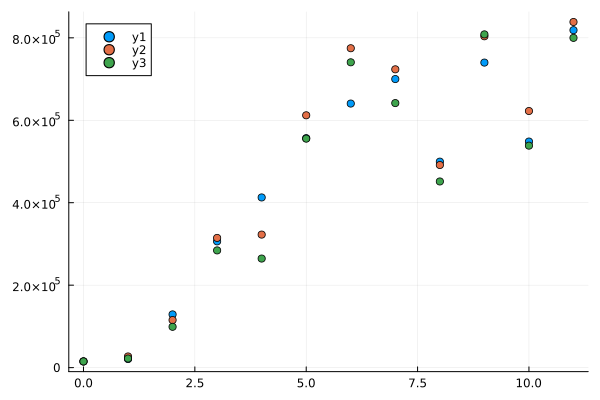

In [168]:
timepts= [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0];
repli1=data[:,1];
repli2=data[:,2];
repli3=data[:,3];

scatter(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

In [173]:
initial_guess=[0.3]

1-element Vector{Float64}:
 0.3

In [174]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability d

 * Status: success

 * Candidate solution
    Final objective value:     1.012753e+03

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 2.33e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 6.07e-10 ≰ 0.0e+00
    |f(x) - f(x')|         = 3.64e-12 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 3.59e-15 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    7
    f(x) calls:    24
    ∇f(x) calls:   24


In [175]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 0.38450150467804933

In [176]:
optimized_aic_exp=calculate_aic_exp(paramFIT,data)

1012.7526694944071

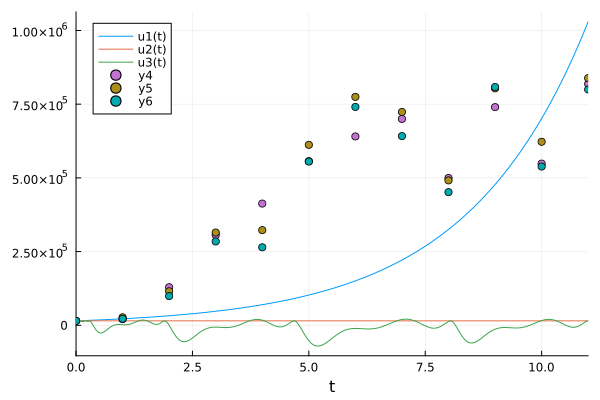

In [178]:
problem = ODEProblem(singleExpGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

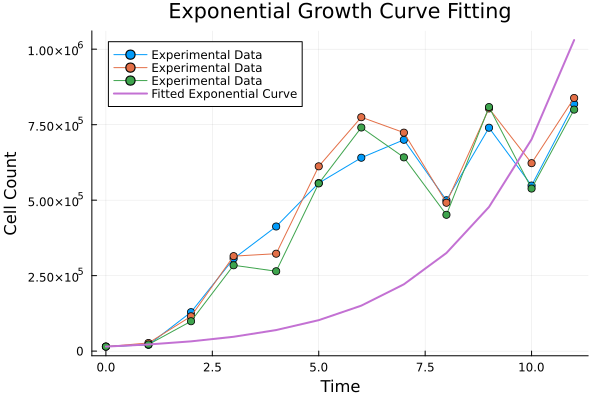

In [179]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleExpGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Exponential Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Exponential Growth Curve Fitting")

In [180]:
model_data

12-element Vector{Float64}:
  15000.0
  22033.23302282565
  32364.212944694933
  47539.248189843376
  69829.41927817764
 102570.12012835534
 150664.78935605465
 221305.60697621497
 325070.5184526344
 477486.76899937453
 701369.9831244376
      1.0302363037639837e6

In [189]:
initial_guess=[0.9,300000]

2-element Vector{Float64}:
      0.9
 300000.0

In [190]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_log(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.324263e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 0.00e+00 ≤ 0.0e+00
    |x - x'|/|x'|          = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.89e-05 ≰ 1.0e-16

 * Work counters
    Seconds run:   16  (vs limit Inf)
    Iterations:    14909
    f(x) calls:    96289
    ∇f(x) calls:   96289


In [191]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      1.0582707466874328
 685982.7798949984

In [192]:
optimized_aic_log=calculate_aic_log(paramFIT,data)

932.4262705191873

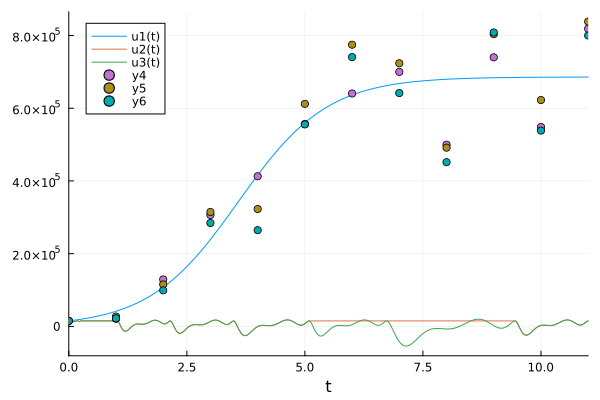

In [193]:
problem = ODEProblem(singleLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)


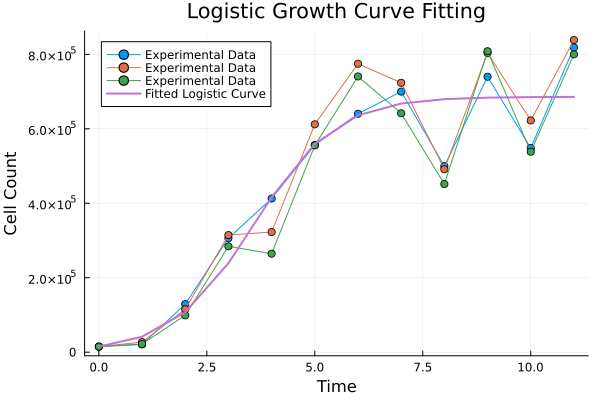

In [194]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Logistic Growth Curve Fitting")

In [195]:
model_data

12-element Vector{Float64}:
  15000.0
  41512.914571103705
 107387.44321259654
 239028.6727419917
 416011.0604368935
 559889.9998273889
 636292.3974382784
 667883.9143202722
 679613.9016543864
 683747.320737423
 685188.7457298654
 685706.6441775177

In [224]:
initial_guess=[0.4,700000]

2-element Vector{Float64}:
      0.4
 700000.0

In [225]:
result = optimize(params -> calculate_aic_gomp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))


 * Status: success

 * Candidate solution
    Final objective value:     9.353143e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 5.75e-12 ≰ 0.0e+00
    |x - x'|/|x'|          = 7.86e-18 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 2.12e-04 ≰ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    139
    f(x) calls:    615
    ∇f(x) calls:   615


In [226]:
paramFIT=result.minimizer

2-element Vector{Float64}:
      0.48302324445999517
 731675.8211090463

In [227]:
optimized_aic_gomp=calculate_aic_gomp(paramFIT,data)

935.3143206259901

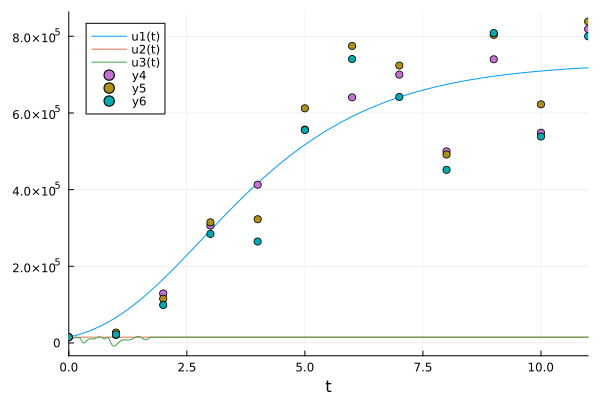

In [229]:
problem = ODEProblem(singleGompGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

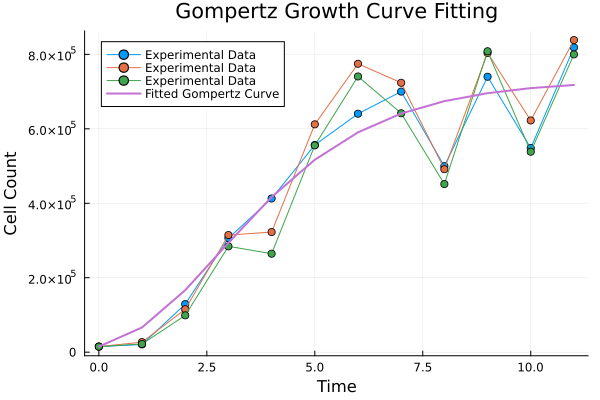

In [230]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGompGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Gompertz Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Gompertz Growth Curve Fitting")

In [231]:
model_data

12-element Vector{Float64}:
  15000.0
  66500.55092269022
 166650.07495356587
 293726.1830356277
 416666.431948606
 516970.9083712131
 590585.7199246687
 641119.1448157247
 674364.5890647565
 695767.0923692149
 709315.9953346674
 717793.6078841736

In [232]:
initial_guess=[10.0]

1-element Vector{Float64}:
 10.0

In [233]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_bert(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

 * Status: success

 * Candidate solution
    Final objective value:     9.925427e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.66e-07 ≰ 0.0e+00
    |x - x'|/|x'|          = 8.08e-09 ≰ 0.0e+00
    |f(x) - f(x')|         = 3.87e-12 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 3.89e-15 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    4
    f(x) calls:    13
    ∇f(x) calls:   13


In [234]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 20.55728259056284

In [235]:
optimized_aic_bert=calculate_aic_bert(paramFIT,data)

992.542709991503

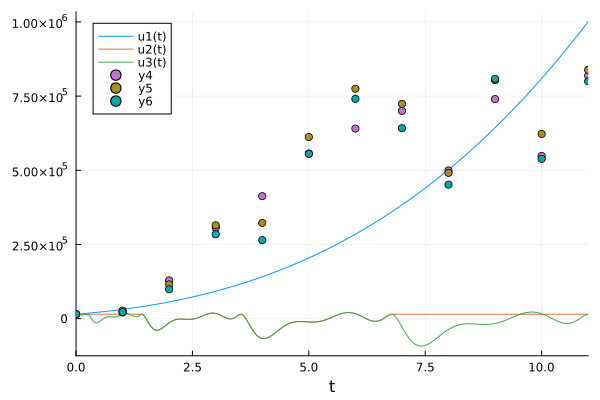

In [236]:
problem = ODEProblem(singleBertGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

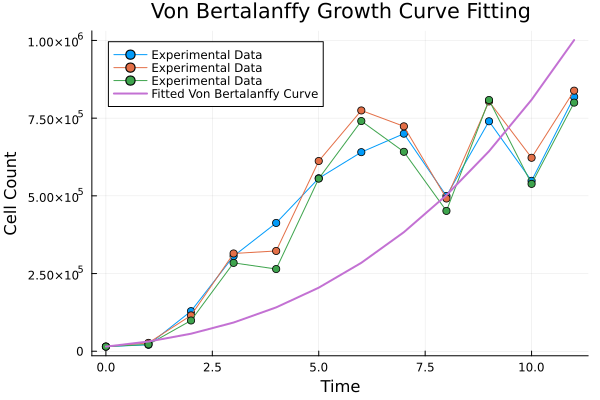

In [237]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleBertGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Von Bertalanffy Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Von Bertalanffy Growth Curve Fitting")

In [238]:
model_data

12-element Vector{Float64}:
  15000.0
  31299.1995952893
  56477.11184702044
  92464.32902910351
 141191.46150798313
 204588.4451861203
 284587.2668757646
 383116.39294930303
 502109.5556490872
 643491.7533330161
 809201.8045885263
      1.0011646300326416e6

In [259]:
initial_guess=[0.5,800000.0,1.0]

3-element Vector{Float64}:
      0.5
 800000.0
      1.0

In [260]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_genlog(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


 * Status: failure (line search failed)

 * Candidate solution
    Final objective value:     9.355856e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 2.00e-03 ≰ 0.0e+00
    |x - x'|/|x'|          = 2.81e-09 ≰ 0.0e+00
    |f(x) - f(x')|         = 9.57e-05 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.02e-07 ≰ 0.0e+00
    |g(x)|                 = 8.90e+03 ≰ 1.0e-16

 * Work counters
    Seconds run:   1  (vs limit Inf)
    Iterations:    707
    f(x) calls:    3987
    ∇f(x) calls:   3987


In [261]:
paramFIT=result.minimizer

3-element Vector{Float64}:
      2.0862022160576212
 712785.1094261875
      0.2972038982283929

In [262]:
optimized_aic_genlog=calculate_aic_genlog(paramFIT,data)


935.5855813607069

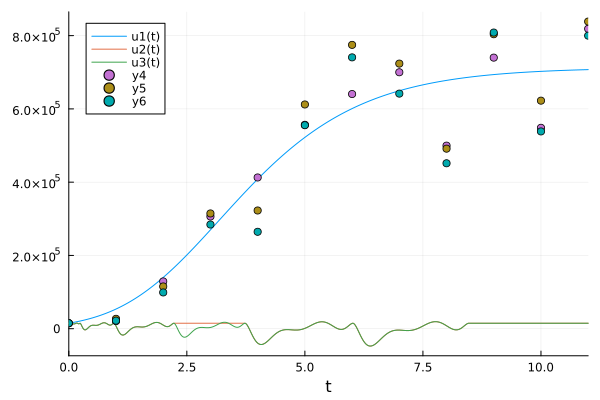

In [263]:
problem = ODEProblem(singleGenLogGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)


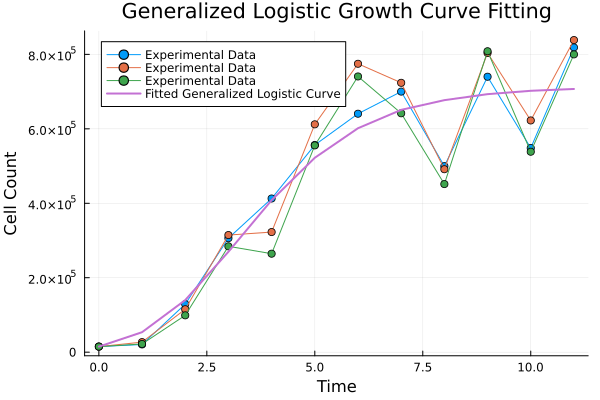

In [264]:
# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleGenLogGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Generalized Logistic Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Generalized Logistic Growth Curve Fitting")

In [265]:
model_data

12-element Vector{Float64}:
  15000.0
  53678.43346638423
 139945.52122725005
 269800.57429447037
 408334.2049807467
 522233.64944966557
 601599.1951787395
 650960.4732009297
 676983.7567658365
 693126.5611095165
 702128.5327994698
 707019.3646566786

In [ ]:
initial_guess=[0.05]

#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

paramFIT=result.minimizer

optimized_aic_exp=calculate_aic_exp(paramFIT,data)

problem = ODEProblem(singleExpGrowth, data[1, :], (0.0, 11.0),paramFIT)
simFit = solve(problem,Vern8());
plot(simFit)
scatter!(timepts,repli1)
scatter!(timepts,repli2)
scatter!(timepts, repli3)

# Extract the optimal parameters from the result
optimal_params = Optim.minimizer(result)

initial_conditions=data[1,:]

# Define the ODE problem with the optimal parameters
prob = ODEProblem(singleExpGrowth, initial_conditions, (0.0, 11.0), optimal_params)

# Solve the ODE using the Tsit5 solver
sol = solve(prob, Tsit5(), saveat=1.0)

# Extract the time and model predictions from the solution
t = 0:1:11
model_data = [sol(ti)[1] for ti in t]

# Plot the experimental data and the fitted exponential curve
plot(t, data, label="Experimental Data", marker=:circle)
plot!(t, model_data, label="Fitted Exponential Curve", linewidth=2)
xlabel!("Time")
ylabel!("Cell Count")
title!("Exponential Growth Curve Fitting")

# try a AIC like metric

In [261]:
#Function to calculate the AIC based on the relative squared error
function calculate_aic_exp2(params, data)
    prob = ODEProblem(singleExpGrowth, data[1, :], (0.0, 12.0), params)
    sol = solve(prob, Tsit5(), saveat=1.0)  # Solve the ODE
    model_data = vcat([sol(t)[1] for t in 0:11]...) #should be a vertical column
    rss = sum((data .- model_data).^2)
    n = size(data, 1) * size(data, 2)  # Number of data points
    k = length(params)  # Number of parameters
    aic = 2k + n * log(rss/n) 
    return aic
end

calculate_aic_exp2 (generic function with 1 method)

In [262]:
initial_guess=[0.05]

1-element Vector{Float64}:
 0.05

In [263]:
#Optimize the growth rate to minimize the AIC
result = optimize(params -> calculate_aic_exp2(params, data), initial_guess, LBFGS(), 
    Optim.Options(f_tol=0.0, g_tol=1e-16, allow_f_increases=true, iterations=100000))

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/8XHkk/src/integrator_interface.jl:606


 * Status: success

 * Candidate solution
    Final objective value:     8.618562e+02

 * Found with
    Algorithm:     L-BFGS

 * Convergence measures
    |x - x'|               = 1.09e-09 ≰ 0.0e+00
    |x - x'|/|x'|          = 3.32e-09 ≰ 0.0e+00
    |f(x) - f(x')|         = 1.32e-11 ≰ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 1.53e-14 ≰ 0.0e+00
    |g(x)|                 = 0.00e+00 ≤ 1.0e-16

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    4
    f(x) calls:    17
    ∇f(x) calls:   17


In [268]:
paramFIT=result.minimizer

1-element Vector{Float64}:
 0.32898232948307315

In [269]:
optimized_aic_exp=calculate_aic_exp2(paramFIT,data)

861.8561801245269